<a href="https://colab.research.google.com/github/drSever/drSever_data_science/blob/main/Portfolio/Project_4/project_IntelliVision_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Проект: Кластеризация изображений транспортных средств

Александр Журавлев DST-120

Проект выполнен на платформе Google Colab Pro.    
Видеокарта: A100.    
Объем ОЗУ: 83.5GB

***

## Постановка задачи

<center> <img src=https://i.ibb.co/t8DvkyB/smart-city-image-1.jpg align="right" width="300"/> </center>
<center> <img src=https://i.ibb.co/qYkWNVh/smart-city-image-3.jpg align="right" width="300"/> </center>


Один из ключевых проектов IntelliVision — Smart City/Transportation, система, обеспечивающая безопасность дорожного движения и более эффективную работу парковок. С помощью Smart City/Transportation можно контролировать сигналы светофоров и соблюдение ограничений скорости, определять виды транспортных средств, распознавать номерные знаки, считать автомобили и людей.

В основе всех перечисленных возможностей проекта лежит CV (Computer Vision, компьютерное зрение). Чтобы их реализовать, компания использует модели, для обучения которых применяются огромные размеченные датасеты с изображениями транспортных средств. Однако система работает в режиме реального времени и с каждым днём данных становится всё больше. Алгоритм нуждается в постоянной модернизации и должен учитывать множество факторов.

Для модификации и повышения эффективности системы Smart City/Transportation команде необходимо автоматизировать определение дополнительных параметров авто на изображении:

* тип автомобиля (кузова),
* ракурс снимка (вид сзади/спереди),
* цвет автомобиля,
* другие характеристики.

Также необходимо автоматизировать поиск выбросов в данных (засветы и блики на изображениях, изображения, на которых отсутствуют автомобили и т. д.).

К сожалению, у компании нет комплексной модели, которая могла бы одновременно находить на изображении автомобиль и определять все нужные параметры. Её нужно построить, однако многокомпонентная разметка новых данных по всем этим параметрам — очень трудозатратное занятие, которое стоит больших денег.

При решении задачи разметки данных у команды возникла гипотеза, которая нуждается в исследовании.


**Гипотеза:** разметку исходных данных можно эффективно провести с помощью методов кластеризации.


**В чём идея?**

*Давайте будем использовать небольшой набор моделей свёрточных нейронных сетей, обученных на различных датасетах и решающих различные задачи от классификации изображений по цвету до классификации типов транспортных средств, пропустим нашу базу изображений через каждую модель, но возьмём не выходной результат модели, а только промежуточное представление признаков (дескриптор), полученное на свёрточных слоях сети.*

*Выполним такую операцию для всех изображений из набора данных, на основе полученных дескрипторов кластеризуем изображения, проинтерпретируем полученные кластеры и попробуем найти в них необходимую информацию.*

Теперь, когда мы обсудили гипотезу, перейдём к постановке задачи.

<center> <img src=https://i.ibb.co/hLcBpZF/2023-03-27-12-11-17.png align="right" width="500"/> </center>

У вас будет набор из 416 314 изображений транспортных средств различных типов, цветов и снятых с разных ракурсов.

Команда IntelliVision уже обработала свой набор данных с помощью нескольких моделей глубокого обучения (свёрточных нейронных сетей) и получила четыре варианта вектора признаков (дескрипторов) для каждого изображения.

**Ваша задача** — используя готовые дескрипторы, разбить изображения на кластеры и проинтерпретировать каждый из них. Для всех вариантов дескрипторов нужно применить несколько алгоритмов кластеризации и сравнить полученные результаты. Сравнивать можно на основе метрик, визуализаций плотностей кластеров и по тому, насколько хорошо интерпретируются кластеры.

Дополнительная подзадача — найти выбросы среди изображений. Это могут быть изображения плохого качества, изображения с бликами или изображения, на которых нет транспортных средств и т. д.

Бизнес-задача: исследовать возможность применения алгоритмов кластеризации для разметки новых данных и поиска выбросов.

Техническая задача для вас как для специалиста в Data Science: построить модель кластеризации изображений на основе дескрипторов, выделяемых с помощью различных архитектур нейронных сетей, проинтерпретировать полученные результаты и выбрать модель или комбинацию моделей, которая выделяет наиболее пригодные для интерпретации признаки.

**Ваши основные цели:**
1. Для каждого типа дескрипторов необходимо:
    * выполнить предобработку дескрипторов;
    * произвести кластеризацию изображений на основе их дескрипторов, подобрав алгоритм и параметры кластеризации;
    * сделать визуализацию полученных кластеров в 2D- или 3D-пространстве;
    * проинтерпретировать полученные кластеры — в паре предложений сформулировать, какие изображения попали в каждый из кластеров.
2. Сравнить между собой полученные кластеризации для каждого типа дескрипторов (по метрикам, визуализации и результатам интерпретации).
3. Выполнить автоматизированный поиск выбросов среди изображений на основе дескрипторов.
4. Дополнительная задача (не оценивается): попробовать воспользоваться смесью дескрипторов, полученных различными моделями, и проинтерпретировать полученные результаты.

**Примечание.** При выборе алгоритма кластеризации следует ориентироваться на внутренние метрики, а именно на индекс Калински — Харабаса (`calinski_harabasz_score`) и индекс Дэвиса — Болдина (`davies_bouldin_score`), а также на интерпретируемость кластеров и визуализацию.

## Данные и их описание

Исходная папка с данными имеет следующую структуру:

```
IntelliVision_case
├─descriptors
    └─efficientnet-b7.pickle
    └─osnet.pickle
    └─vdc_color.pickle
    └─vdc_type.pickle
├─row_data
    └─veriwild.zip
├─images_paths.csv
```

Давайте разберёмся в ней:

* В папке `descriptors` содержатся дескрипторы, полученные для каждого из изображений с помощью соответствующих нейронных сетей, в формате numpy-массивов, сохранённых в файлах pickle:
    * `efficientnet-b7.pickle` — дескрипторы, выделенные моделью классификации с архитектурой EfficientNet версии 7. Эта модель является свёрточной нейронной сетью, предобученной на на датасете ImageNet, в котором содержатся изображения более 1000 различных классов. Эта модель при обучении не видела датасета veriwiId.

    * `osnet.pickle` — дескрипторы, выделенные моделью OSNet, обученной для детектирования людей, животных и машин. Модель не обучалась на исходном датасете veriwiId.

    * `vdc_color.pickle` — дескрипторы, выделенные моделью регрессии для определения цвета транспортных средств в формате RGB. Частично обучена на исходном датасете veriwild.

    * `vdc_type.pickle` — дескрипторы, выделенные моделью классификации транспортных средств по типу на десяти классах. Частично обучена на исходном датасете veriwild.

* В папке `row_data` содержится zip-архив с исходными изображениями автомобилей. Распакуйте его содержимое в папку row_data. Архив содержит десять папок с изображениями, пронумерованных от 1 до 10. Каждая папка содержит подпапки, обозначенные пятизначными цифрами, например 36191.

В каждой из таких подпапок содержатся фотографии одного конкретного автомобиля с разных ракурсов, снятые с помощью дорожных видеокамер.

* В файле `images_paths.csv` представлен список из полных путей до изображений. Он пригодится вам при анализе изображений, попавших в определённый кластер.


***
***

# 0. Подготовительный этап.

## Устанавливаем cuML:

In [ ]:
# предоставленные ресурсы GPU
!nvidia-smi

Mon Jun 26 13:42:43 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0    43W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
%%capture
# устанавливаем cuML
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!python rapidsai-csp-utils/colab/pip-install.py

## Импорт библиотек:

In [ ]:
import pandas as pd
import numpy as np

# для визуализации
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

# настройка визуализации
%matplotlib inline
plt.style.use('seaborn-v0_8')
%config InlineBackend.figure_format = "retina"

# для работы с файлами дескрипторов
import pickle

# для создания пайплайнов
from cuml.pipeline import Pipeline

# для снижения размерности
from cuml.decomposition import PCA, TruncatedSVD
from cuml.manifold import TSNE
from sklearn.manifold import TSNE as sklearn_TSNE

# для стандартизации, нормализации
from cuml.preprocessing import StandardScaler, MinMaxScaler

# алгоритмы кластеризации и расчет внутренних мер
from cuml.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score

## Для воспроизводимости экспериментов:

In [ ]:
random_state = 42

## Подготовка данных:

In [ ]:
# монтируем google.drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%%capture
# извлечем данные из архива
!unzip /content/drive/MyDrive/IntelliVision_case.zip

In [ ]:
# зададим пути к файлам
PATH_DESCRIPTORS = '/content/IntelliVision_case/descriptors/' # путь к файлам дескрипторов
PATH_PATHFILE = '/content/IntelliVision_case/images_paths.csv' # путь к файлу с путями к изображениям
PATH_IMAGES = '/content/IntelliVision_case/raw_data/' # путь к файлам изображений
PATH_OUTPUT = '/content/output/' # путь к сохраненным датасетам с метками кластеров

In [ ]:
# загрузим данные о путях к файлам изображений
paths = pd.read_csv(PATH_PATHFILE)

# обновим пути к файлам
paths['paths'] = paths['paths'].apply(lambda x: PATH_IMAGES + x.replace('\\','/'))

print(f'Размерность path: {paths.shape}')

Размерность path: (416314, 1)


## Необходимые функции:

In [ ]:
def load_descriptors(file_name):
    '''
    Функция загружает данные дескрипторов, преобразует их в датафрейм, добавляет пути к файлам
    изображений дескрипторов, проверяет полученные данные на наличие пропусков и дубликатов.
    Параметры функции:
        file_name: имя файла с дескрипторами в виде строки
    Функция возвращает:
        data_df: данные дескрипторов в виде датафрейма с путями к файлам изображений
    '''

    # чтение файла с дескрипторами
    file = open(PATH_DESCRIPTORS + file_name, 'rb') # открываем файл с данными
    data = pickle.load(file) # загружаем файл с данными
    # преобразуем загруженные данные в датафрейм
    data_df = pd.DataFrame(data=data)

    # выводим информацию о данных
    print(f'{file_name}')
    print(f'Размерность: {data_df.shape}')

    # добавляем пути к файлам изображений дескрипторов
    data_df = pd.concat([data_df, paths], axis=1)

    # обновляем информацию о данных, проверяем их на наличие пропусков и дубликатов
    print(f'Размерность с путями к файлам: {data_df.shape}')
    print(f'Количество строк, содержащих пропуски {data_df[data_df.isna().any(axis=1)].shape[0]}')
    print(f'Число найденных дубликатов: {data_df[data_df.duplicated()].shape[0]}\n')

    # закрываем файл с данными дескрипторов
    file.close()

    return data_df

In [ ]:
def get_calinski_harabasz_score(cluster_num, X):
    '''
    Функция для рассчета индекса Калински — Харабаса для алгоритма KMeans, AgglomerativeClustering.
    Также расчитывается количество объектов в полученных кластерах.
    Параметры функции:
        cluster_num: количество кластеров
        X: данные в виде таблицы/двухмерного массива
    Функция возвращает:
        score_km, score_agc: индекс Калински — Харабаса для алгоритмов KMeans, AgglomerativeClustering
        obj_cluster_counts_km, obj_cluster_counts_agc: количество объектов в полученных кластерах для алгоритмов KMeans, AgglomerativeClustering
    '''

    # алгоритм кластеризации KMeans
    km = KMeans(n_clusters=cluster_num, random_state=random_state)
    # обучаем его на наших данных
    km.fit_predict(X)
    # вычисляем значение индекса
    score_km = calinski_harabasz_score(X, km.labels_)
    # вычисляем количество объектов в кластерах
    unique_km, obj_cluster_counts_km = np.unique(km.labels_, return_counts=True)

    # алгоритм кластеризации AgglomerativeClustering
    agc = AgglomerativeClustering(n_clusters=cluster_num)
    # обучаем его на наших данных
    agc.fit_predict(X)
    # вычисляем значение индекса
    score_agc = calinski_harabasz_score(X, agc.labels_)
    # вычисляем количество объектов в кластерах
    unique_agc, obj_cluster_counts_agc = np.unique(agc.labels_, return_counts=True)

    return score_km, score_agc, obj_cluster_counts_km, obj_cluster_counts_agc

In [ ]:
def get_davies_bouldin_score(cluster_num, X):
    '''
    Функция для рассчетв индекса Дэвиса — Болдина для алгоритма KMeans, AgglomerativeClustering
    Параметры функции:
        cluster_num: количество кластеров
        X: данные в виде таблицы/двухмерного массива
    Функция возвращает:
        score_km, score_agc: индекс Дэвиса — Болдина для алгоритма KMeans, AgglomerativeClustering
    '''

    # алгоритм кластеризации KMeans
    km = KMeans(n_clusters=cluster_num, random_state=random_state)
    # обучаем его на наших данных
    km.fit_predict(X)
    # вычисляем значение индекса
    score_km = davies_bouldin_score(X, km.labels_)

    # алгоритм кластеризации AgglomerativeClustering
    agc = AgglomerativeClustering(n_clusters=cluster_num)
    # обучаем его на наших данных
    agc.fit_predict(X)
    # вычисляем значение индекса
    score_agc = davies_bouldin_score(X, agc.labels_)

    return score_km, score_agc

In [ ]:
def clustering_proba(data):
    '''
    Функция расчитывает индексы Калински-Харабаса (используется функция get_calinski_harabasz_score),
    индексы Дэвиса-Болдина (используется функция get_davies_bouldin_score),
    количество объектов в кластерах (так же используется функция get_calinski_harabasz_score)
    в зависимости от количества кластеров для алгоритмов KMeans, AgglomerativeClustering.
    Выводит рассчитанные данные в виде диаграмм и сводной таблицы.
    Параметры функции:
        data: массив данных со сниженной размерностью
    '''

    # создадим списки, где будут индексы
    KMeans_calinski_harabasz_score = [] # индекс Калински-Харабаса для алгоритма KMeans
    KMeans_davies_bouldin_score = [] # индекс Дэвиса-Болдина для алгоритма KMeans
    AGC_calinski_harabasz_score = [] # индекс Калински-Харабаса для алгоритма AgglomerativeClustering
    AGC_davies_bouldin_score = [] # индекс Дэвиса-Болдина для алгоритма AgglomerativeClustering
    # создадим списки с количеством объектов в кластерах для обоих алгоритмов
    KMeans_obj_cluster_counts = [] # количество объектов в кластерах для KMeans
    AGC_obj_cluster_counts = [] # количество объектов в кластерах для AgglomerativeClustering

    # расчитаем индекс Калински — Харабаса для 2-10 кластеров
    for cluster_num in range(2,11):
        # рассчитываем индексы для обоих алгоритмов и получаем количество объектов в кластерах
        score_km, score_agc, obj_cluster_counts_km, obj_cluster_counts_agc = get_calinski_harabasz_score(cluster_num, data)
        # добавляем полученные данные в соответствующие списки
        KMeans_calinski_harabasz_score.append(score_km)
        AGC_calinski_harabasz_score.append(score_agc)
        KMeans_obj_cluster_counts.append(obj_cluster_counts_km)
        AGC_obj_cluster_counts.append(obj_cluster_counts_agc)

    # расчитаем индекс Дэвиса — Болдина для 2-10 кластеров
    for cluster_num in range(2,11):
        # рассчитываем индексы для обоих алгоритмов
        score_km, score_agc = get_davies_bouldin_score(cluster_num, data)
        # добавляем полученные данные в соответствующие списки
        KMeans_davies_bouldin_score.append(score_km)
        AGC_davies_bouldin_score.append(score_agc)

    # визуализируем полученные данные (индексы)

    plt.figure(figsize=[16, 3])

    # индекс Калински-Харабаса для алгоритма KMeans
    plt.subplot(1, 4, 1)
    plt.title("CH values (KMeans)")
    plt.xlabel("No. of clusters", fontsize=12)
    plt.ylabel("CH values", fontsize=12)
    plt.plot([i for i in range(2, 11)], KMeans_calinski_harabasz_score, color='b', label='KMeans')
    plt.legend()

    # индекс Дэвиса-Болдина для алгоритма KMeans
    plt.subplot(1, 4, 2)
    plt.title("DB index (KMeans)")
    plt.xlabel("No. of clusters", fontsize=12)
    plt.ylabel("DB index", fontsize=12)
    plt.plot([i for i in range(2, 11)], KMeans_davies_bouldin_score, color='b', label='KMeans')
    plt.legend()

    # индекс Калински-Харабаса для алгоритма AgglomerativeClustering
    plt.subplot(1, 4, 3)
    plt.title("CH values (AGC)")
    plt.xlabel("No. of clusters", fontsize=12)
    plt.ylabel("CH values", fontsize=12)
    plt.plot([i for i in range(2, 11)], AGC_calinski_harabasz_score, color='g', label='AgglomerativeClustering')
    plt.legend()

    # индекс Дэвиса-Болдина для алгоритма AgglomerativeClustering
    plt.subplot(1, 4, 4)
    plt.title("DB index (AGC)")
    plt.xlabel("No. of clusters", fontsize=12)
    plt.ylabel("DB index", fontsize=12)
    plt.plot([i for i in range(2, 11)], AGC_davies_bouldin_score, color='g', label='AgglomerativeClustering')
    plt.legend()

    plt.show();

    # выводим значения индексов и количество объектов в кластеров в виде таблицы
    cluster_metric = pd.DataFrame({
        'clusters': [i for i in range(2, 11)],
        'KMeans_CH_value': KMeans_calinski_harabasz_score,
        'AGC_CH_value': AGC_calinski_harabasz_score,
        'KMeans_DB_index': KMeans_davies_bouldin_score,
        'AGC_DB_index': AGC_davies_bouldin_score,
        'KMeans_object_cluster_counts': KMeans_obj_cluster_counts,
        'AGC_object_cluster_counts':AGC_obj_cluster_counts

    })
    display(cluster_metric)

In [ ]:
def clusterisation_test(X, n_components):
    '''
    Функция, получая на вход датафрейм с дескрипторами и количество компонент, уменьшает размерность данных,
    используя методы PCA и SVD, и, с помощью функции clustering_proba, выполняет кластеризацию данных с
    уменьшенной размерностью, расчитывает индексы Калински-Харабаса и Дэвиса-Болдина, количество объектов в кластерах
    в зависимости от количества кластеров для алгоритмов KMeans, AgglomerativeClustering.
    Выводит рассчитанные данные в виде диаграмм и сводной таблицы.
    Параметры функции:
        Х: датафрейм с дескрипторами
        n_components: количество компонент для алгоритмов снижения размерности
    '''

    # создадим pipeline PCA
    pipeline_pca = Pipeline([
        # стандартизация данных
        ('scaler', StandardScaler()),
        # снижение размерности данных
        ('pca', PCA(n_components=n_components, random_state=random_state))
    ])
    # уменьшаем размерность данных (убираем столбец с путями к файлам изображений)
    X_test_pca = pipeline_pca.fit_transform(X.drop('paths', axis=1))
    print(f'Разменость данных (стандартизация, PCA n_components={n_components}): {X_test_pca.shape}\n')
    # визуализируем кластеризацию для алгоритмов KMeans и AgglomerativeClustering для 2-10 кластеров
    print(f'Внутренние меры алгоритмов KMeans и AgglomerativeClustering (стандартизация, PCA n_components={n_components})')
    clustering_proba(X_test_pca)

    print('-'*150) # визуально разделяем выведенные данные

    # создадим pipeline SVD (нормализация)
    pipeline_norm_svd = Pipeline([
        # нормализация данных
        ('scaler', MinMaxScaler()),
        # снижение размерности данных
        ('SVD', TruncatedSVD(n_components=n_components, random_state=random_state))
    ])
    # уменьшаем размерность данных (убираем столбец с путями к файлам изображений)
    X_test_norm_svd = pipeline_norm_svd.fit_transform(X.drop('paths', axis=1))
    print(f'Разменость данных (нормализация, SVD n_components={n_components}): {X_test_norm_svd.shape}\n')
    # визуализируем кластеризацию для алгоритмов KMeans и AgglomerativeClustering для 2-10 кластеров
    print(f'Внутренние меры алгоритмов KMeans и AgglomerativeClustering (нормализация, SVD n_components={n_components})')
    clustering_proba(X_test_norm_svd)

    print('-'*150) # визуально разделяем выведенные данные

    # создадим pipeline SVD (стандартизация)
    pipeline_std_svd = Pipeline([
        # стандартизация данных
        ('scaler', StandardScaler()),
        # снижение размерности данных
        ('SVD', TruncatedSVD(n_components=n_components, random_state=random_state))
    ])
    # уменьшаем размерность данных (убираем столбец с путями к файлам изображений)
    X_test_std_svd = pipeline_std_svd.fit_transform(X.drop('paths', axis=1))
    print(f'Разменость данных (стандартизация, SVD n_components={n_components}): {X_test_std_svd.shape}\n')
    # визуализируем кластеризацию для алгоритмов KMeans и AgglomerativeClustering для 2-10 кластеров
    print(f'Внутренние меры алгоритмов KMeans и AgglomerativeClustering (стандартизация, SVD n_components={n_components})')
    clustering_proba(X_test_std_svd)

In [ ]:
def clusters_visualisation(data_2D, data_3D, title_2D, title_3D):
    '''
    Функция визуализирует результаты кластеризации в 2D и 3D.
    Параметры функции:
        data_2d: массив с 2 компонентами
        data_3d: массив с 3 компонентами
        title_2D: данные для заголовка 2D визуализации в виде строки
        title_3D: данные для заголовка 3D визуализации в виде строки
    '''

    # визуализация кластеризации в 2D
    plt.figure(figsize=(10,6))
    sns.scatterplot(
        data=data_2D,
        x=data_2D[:,0],
        y=data_2D[:,1],
        hue=data_2D[:,-1]
    )
    plt.title(f'Диаграмма рассеяния данных с кластеризацией ({title_2D})')
    plt.xlabel('1-я компонента')
    plt.ylabel('2-я компонента')
    plt.show();

    # визуализация кластеризации в 3D
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(projection='3d')
    ax.scatter(
        data_3D[:,0],
        data_3D[:,1],
        data_3D[:,2],
        c=data_3D[:,-1],
        cmap='viridis'
    )
    ax.set_title(f'Диаграмма рассеяния данных с кластеризацией ({title_3D})')
    ax.set_xlabel('1-я компонента')
    ax.set_ylabel('2-я компонента')
    ax.set_zlabel('3-я компонента')
    plt.show();

In [ ]:
def plot_samples_images(data, cluster_feature, cluster_label, nrows=3, ncols=3, figsize=(12, 5)):
    """Функция для визуализации нескольких случайных изображений из кластера cluster_label.
    Пути до изображений и метки кластеров должны быть представлены в виде DataFrame со столбцами "paths" и "cluster".


    Args:
        data (DataFrame): таблица с разметкой изображений и соответствующих им кластеров.
        cluster_feature (str): признак, содержащий метки кластеров.
        cluster_label (int): номер кластера изображений.
        nrows (int, optional): количество изображений по строкам таблицы (по умолчанию 3).
        ncols (int, optional): количество изображений по столбцам (по умолчанию 3).
        figsize (tuple, optional): размер фигуры (по умолчанию (12, 5)).
    """
    # Фильтруем данные по номеру кластера
    samples_indexes = np.array(data[data[cluster_feature] == cluster_label].index)
    # Перемешиваем результаты
    np.random.shuffle(samples_indexes)
    # Составляем пути до изображений
    paths = data.loc[samples_indexes, 'paths']

    # Создаём фигуру и набор координатных плоскостей
    fig, axes = plt.subplots(nrows,ncols)
    # Устанавливаем размер фигуры
    fig.set_size_inches(*figsize)
    # Устанавливаем название графика
    fig.suptitle(f"Images from cluster {cluster_label}", fontsize=16)
    # Создаём цикл по строкам в таблице с координатными плоскостями
    for i in range(nrows):
        # Создаём цикл по столбцам в таблице с координатными плоскостями
        for j in range(ncols):
            # Определяем индекс пути до изображения
            path_idx = i * ncols + j
            if path_idx >= len(paths):
                break
            # Извлекаем путь до изображения
            path = paths.iloc[path_idx]
            # Читаем изображение
            img = plt.imread(path)
            # Отображаем его на соответствующей координатной плоскости
            axes[i,j].imshow(img)
            # Убираем пометки координатных осей
            axes[i,j].axis('off')

***
***

# 3. Дескрипторы **vdc_color.pickle**

## 3.1. Загрузка, первичная обработка и знакомство с данными

In [ ]:
%%time
descriptors = load_descriptors('vdc_color.pickle')

vdc_color.pickle
Размерность: (416314, 128)
Размерность с путями к файлам: (416314, 129)
Количество строк, содержащих пропуски 0
Число найденных дубликатов: 0

CPU times: user 4.3 s, sys: 61.1 ms, total: 4.36 s
Wall time: 5.1 s


## 3.2. Проводим тестовую кластеризацию
- Алгоритмы: **KMeans** и **AgglomerativeClustering**
- Количество кластеров **2-10**
- Внутренние меры: **Calinski-Harabasz Index**, **Davies-Bouldin Index**

Разменость данных (стандартизация, PCA n_components=50): (416314, 50)

Внутренние меры алгоритмов KMeans и AgglomerativeClustering (стандартизация, PCA n_components=50)


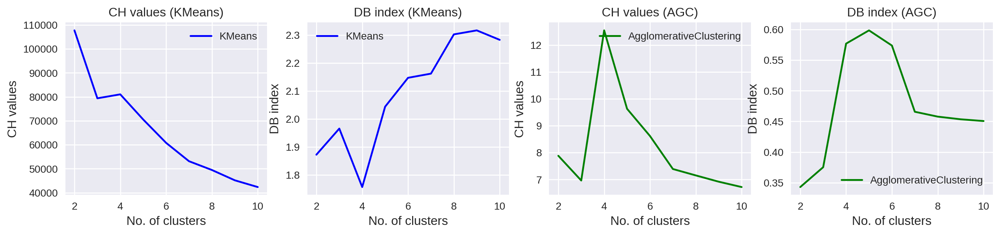

,clusters,KMeans_CH_value,AGC_CH_value,KMeans_DB_index,AGC_DB_index,KMeans_object_cluster_counts,AGC_object_cluster_counts
0,2,107716.795825,7.883780,1.872259,0.342826,"[206163, 210151]","[416313, 1]"
1,3,79388.532022,6.965361,1.965610,0.375241,"[181313, 109043, 125958]","[416312, 1, 1]"
2,4,81037.505975,12.541590,1.756485,0.577000,"[105117, 123346, 164507, 23344]","[4, 416308, 1, 1]"
3,5,70555.321633,9.628775,2.043931,0.598616,"[93603, 70252, 22597, 120052, 109810]","[416308, 3, 1, 1, 1]"
4,6,60811.241744,8.618538,2.147238,0.573834,"[117766, 48952, 93698, 54366, 20510, 81022]","[3, 416307, 1, 1, 1, 1]"
5,7,53142.973045,7.392422,2.162164,0.465739,"[93420, 45421, 117978, 55643, 8065, 78945, 16842]","[416307, 2, 1, 1, 1, 1, 1]"
6,8,49483.995985,7.154685,2.302543,0.457797,"[67018, 76555, 20365, 49445, 61275, 51003, 413...","[416306, 2, 1, 1, 1, 1, 1, 1]"
7,9,45184.919051,6.921132,2.316861,0.453451,"[85960, 50120, 7941, 45158, 74783, 16683, 4815...","[416305, 2, 1, 1, 1, 1, 1, 1, 1]"
8,10,42371.622527,6.722474,2.283063,0.450593,"[63146, 47173, 7941, 59643, 61436, 15979, 1665...","[416304, 2, 1, 1, 1, 1, 1, 1, 1, 1]"


------------------------------------------------------------------------------------------------------------------------------------------------------
Разменость данных (нормализация, SVD n_components=50): (416314, 50)

Внутренние меры алгоритмов KMeans и AgglomerativeClustering (нормализация, SVD n_components=50)


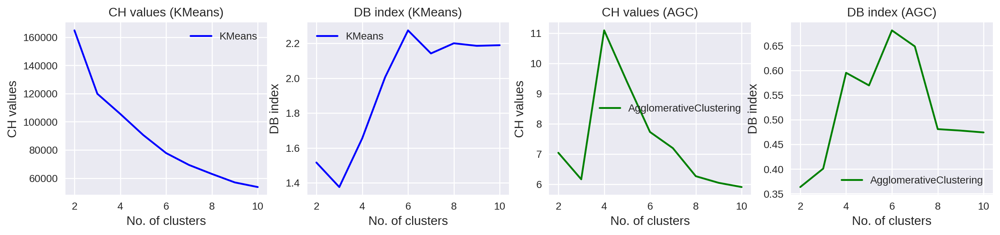

,clusters,KMeans_CH_value,AGC_CH_value,KMeans_DB_index,AGC_DB_index,KMeans_object_cluster_counts,AGC_object_cluster_counts
0,2,164833.706478,7.038860,1.516533,0.363631,"[210321, 205993]","[416313, 1]"
1,3,119851.167505,6.160946,1.375938,0.400946,"[207413, 23723, 185178]","[416312, 1, 1]"
2,4,105576.606571,11.089970,1.654936,0.595050,"[99603, 124836, 23457, 168418]","[416308, 4, 1, 1]"
3,5,90641.882075,9.382745,2.005665,0.569486,"[99224, 22579, 122587, 80015, 91909]","[4, 416307, 1, 1, 1]"
4,6,77805.378234,7.727286,2.273941,0.680945,"[50141, 70943, 80839, 22554, 101297, 90540]","[416307, 2, 2, 1, 1, 1]"
5,7,69363.325758,7.191898,2.141797,0.648510,"[70431, 72054, 22542, 46713, 90441, 66414, 47719]","[2, 416306, 2, 1, 1, 1, 1]"
6,8,62989.391299,6.263360,2.199998,0.480938,"[76510, 52938, 22455, 17909, 47213, 57978, 658...","[416306, 2, 1, 1, 1, 1, 1, 1]"
7,9,56976.111669,6.043886,2.185413,0.477975,"[80315, 21954, 16799, 55739, 76927, 52384, 562...","[416305, 2, 1, 1, 1, 1, 1, 1, 1]"
8,10,53695.765259,5.904429,2.188953,0.474251,"[50377, 46785, 8092, 64154, 44796, 17348, 1666...","[416304, 2, 1, 1, 1, 1, 1, 1, 1, 1]"


------------------------------------------------------------------------------------------------------------------------------------------------------
Разменость данных (стандартизация, SVD n_components=50): (416314, 50)

Внутренние меры алгоритмов KMeans и AgglomerativeClustering (стандартизация, SVD n_components=50)


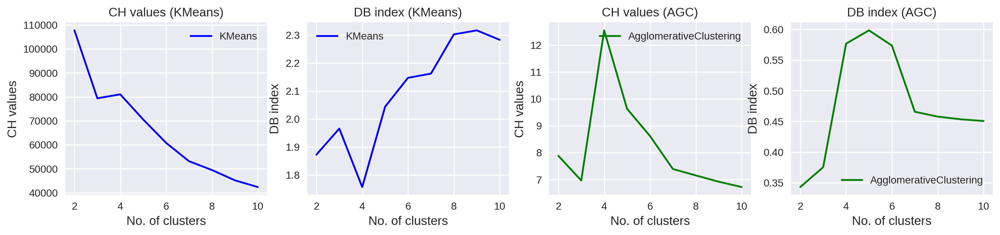

,clusters,KMeans_CH_value,AGC_CH_value,KMeans_DB_index,AGC_DB_index,KMeans_object_cluster_counts,AGC_object_cluster_counts
0,2,107716.783153,7.883777,1.872259,0.342826,"[206163, 210151]","[416313, 1]"
1,3,79388.528467,6.965358,1.965610,0.375242,"[181313, 109043, 125958]","[416312, 1, 1]"
2,4,81037.493547,12.541587,1.756485,0.577000,"[105117, 123346, 164507, 23344]","[4, 416308, 1, 1]"
3,5,70555.318567,9.628773,2.043934,0.598616,"[93603, 70252, 22597, 120052, 109810]","[416308, 3, 1, 1, 1]"
4,6,60811.237805,8.618536,2.147229,0.573834,"[117766, 48952, 93698, 54366, 20510, 81022]","[3, 416307, 1, 1, 1, 1]"
5,7,53142.974005,7.392420,2.162164,0.465739,"[93420, 45421, 117978, 55643, 8065, 78945, 16842]","[416307, 2, 1, 1, 1, 1, 1]"
6,8,49483.990483,7.154683,2.302565,0.457797,"[67018, 76555, 20365, 49444, 61274, 51003, 413...","[416306, 2, 1, 1, 1, 1, 1, 1]"
7,9,45184.917282,6.921129,2.316844,0.453451,"[85960, 50120, 7941, 45158, 74783, 16683, 4815...","[416305, 2, 1, 1, 1, 1, 1, 1, 1]"
8,10,42371.616440,6.722472,2.283056,0.450593,"[63146, 47170, 7941, 59637, 61438, 15979, 1665...","[416304, 2, 1, 1, 1, 1, 1, 1, 1, 1]"


CPU times: user 4min 33s, sys: 2min 13s, total: 6min 47s
Wall time: 4min 7s


In [ ]:
%%time
clusterisation_test(
    descriptors, # датафрейм с дескрипторами
    50 # количество компонент для методов PCA, SVD
)

**Выводы:**
- Алгоритм AgglomerativeClustering снова хуже справляется с кластеризацией данных:
  - хуже внутренние меры
  - плохое разделение на кластеры: по сути создается один кластер и оставшиеся заполняются единичными объектами
- Алгоритм KMeans справляется с кластеризацией лучше
- Внутренние меры указывают, что более эффективен вариант: нормализация, SVD n_components=50
- Calinski-Harabasz Index указыввет нам, что лучше создать 2 кластера, а Davies-Bouldin Index - 3.
- Остановимся на 2 кластерах (данные делятся почти пополам).

## 3.3. Проводим окончательную кластеризацию
- метод уменьшения размерности: **SVD** (*нормализация*, *n_components=50*)
- алгоритм кластеризации: **KMeans**
- количество кластеров: **2**

In [ ]:
%%time
# нормализация данных
scaler = MinMaxScaler()
descriptors_norm = scaler.fit_transform(descriptors.drop('paths', axis=1))

# используем алгоритм SVD для уменьшения размерности данных
desсriptors_svd = TruncatedSVD(n_components=50, random_state=random_state).\
    fit_transform(descriptors_norm)

# алгоритм кластеризации KMeans
km = KMeans(n_clusters=2, random_state=random_state)
# обучаем его на наших данных с уменьшенной размерностью
km.fit_predict(desсriptors_svd)

# получаем метки кластеров
predict_km = km.labels_

# снизим размерность данных для 2D и 3D визуализации
descriptors_visual_2D = TSNE(n_components=2, random_state=random_state).fit_transform(descriptors_norm)
descriptors_visual_3D = PCA(n_components=3, random_state=random_state).fit_transform(descriptors_norm)

# добавим метки кластеров в данные
descriptors_visual_2D = np.append(descriptors_visual_2D, predict_km.values.reshape(-1,1), axis=1)
descriptors_visual_3D = np.append(descriptors_visual_3D, predict_km.values.reshape(-1,1), axis=1)
descriptors['cluster'] = predict_km

# выведем в виде таблицы кластеры и количество объектов в них
display(descriptors.groupby('cluster').agg({0:'count'}).reset_index().rename(columns={0:'count'}))

/usr/local/lib/python3.10/dist-packages/cuml/internals/api_decorators.py:344: UserWarning: Starting from version 22.04, the default method of TSNE is 'fft'.
  return func(**kwargs)


[W] [17:01:20.069471] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


,cluster,count
0,0,210321
1,1,205993


CPU times: user 13.6 s, sys: 91.7 ms, total: 13.7 s
Wall time: 13.5 s


**Вывод:** получено 2 кластера, данные разделились почти пополам.

## 3.4. Визуализация кластеров

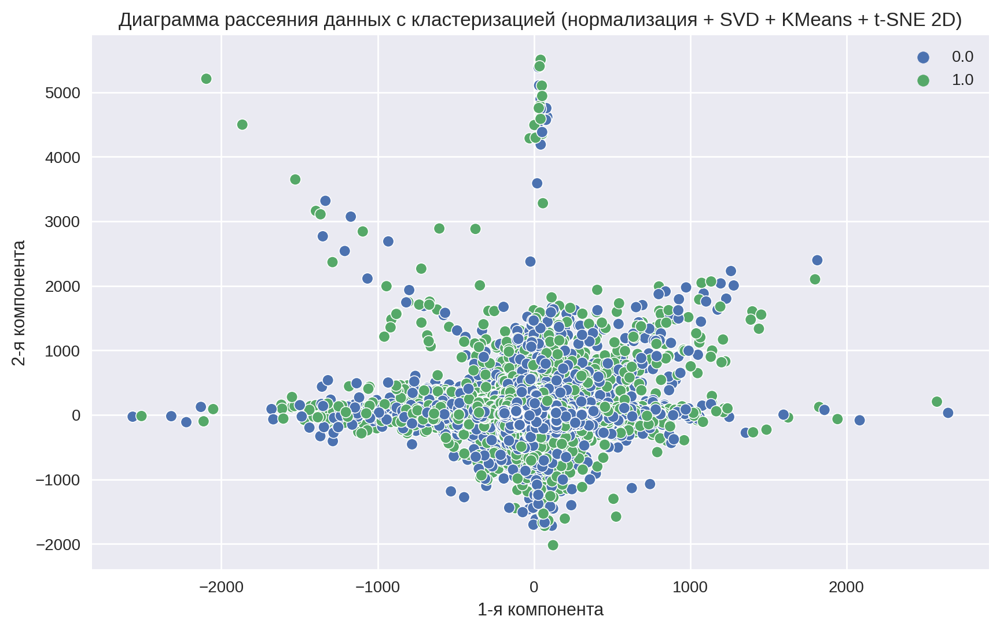

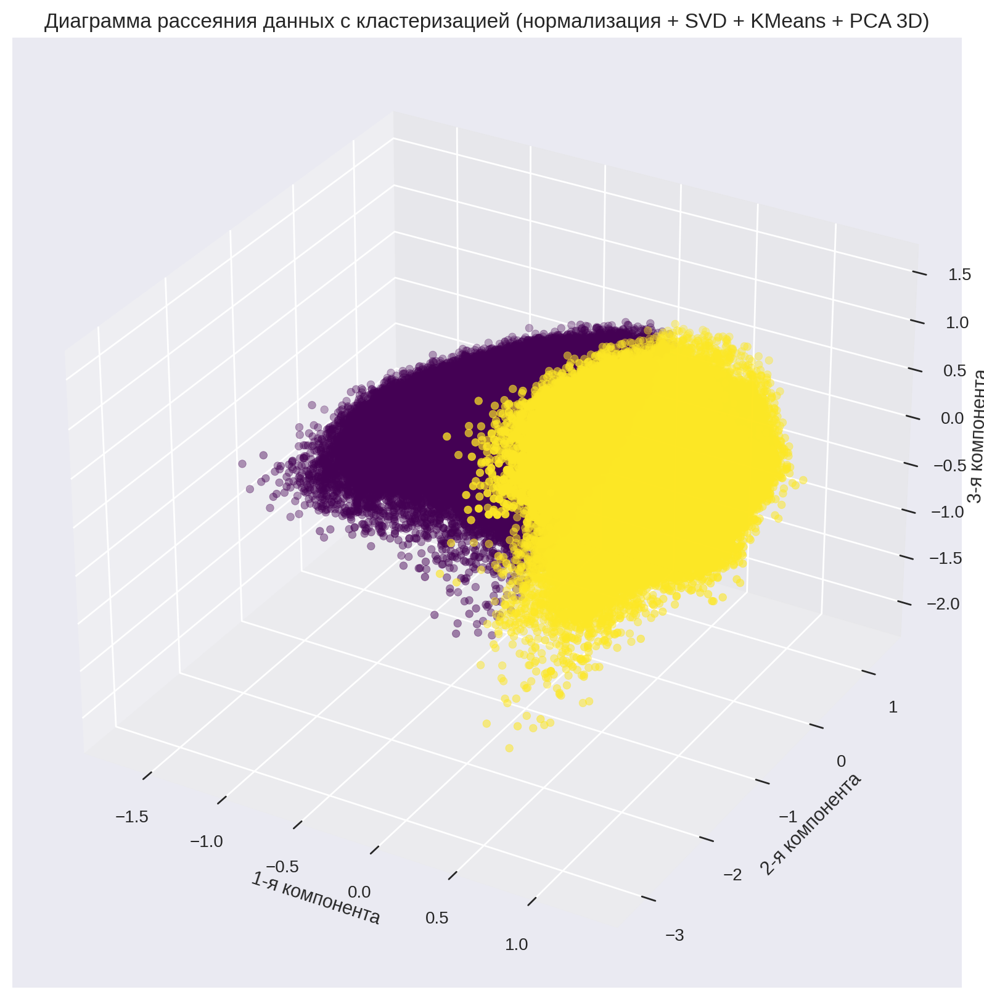

CPU times: user 26 s, sys: 5.87 s, total: 31.8 s
Wall time: 26.8 s


In [ ]:
%%time
clusters_visualisation(
    data_2D = descriptors_visual_2D, # массив с 2 компонентами
    data_3D = descriptors_visual_3D, # массив с 3 компонентами
    title_2D = 'нормализация + SVD + KMeans + t-SNE 2D', # данные для заголовка 2D визуализации
    title_3D = 'нормализация + SVD + KMeans + PCA 3D' # данные для заголовка 3D визуализации
)

**Выводы:**
- на 2D-визуализации четкого разделения на кластеры мы не видим
- на 2D-визуализации мы видим отделные объекты в стороне от общих данных - выбросы?
- на 3D-визуализации данные разделены более хорошо

## 3.5. Поиск выбросов

Используем алгоритм DBSCAN для поиска выбросов (вручную переберем разные параметры алгоритма).

In [ ]:
%%time
# алгоритм кластеризации DBSCAN
dbs = DBSCAN(eps=0.01, min_samples=50)
# обучаем его на наших данных с уменьшенной размерностью для 2D визуализации (за вычетом меток кластеров KMeans)
dbs.fit_predict(descriptors_visual_2D[:,:2])

# получаем метки кластеров
predict_dbs = dbs.labels_

# добавим метки кластеров в данные
descriptors_visual_2D = np.append(descriptors_visual_2D[:,:2], predict_dbs.reshape(-1,1), axis=1)
descriptors_visual_3D = np.append(descriptors_visual_3D, predict_dbs.reshape(-1,1), axis=1)
descriptors['dbscan'] = predict_dbs

# выведем в виде таблицы кластеры и количество объектов в них
display(descriptors.groupby('dbscan').agg({0:'count'}).reset_index().rename(columns={0:'count'}))

[W] [17:06:34.552410] Batch size limited by the chosen integer type (4 bytes). 16322 -> 5158. Using the larger integer type might result in better performance


,dbscan,count
0,-1,363370
1,0,28863
2,1,22543
3,2,588
4,3,70
5,4,152
6,5,138
7,6,70
8,7,245
9,8,90


CPU times: user 3.11 s, sys: 23.8 ms, total: 3.13 s
Wall time: 3.09 s


Мы получили 14 кластеров. Выбросами будем считать 11 кластеров с количеством объектов менее 600.

## 3.6. Визуализация изображений в кластерах KMeans

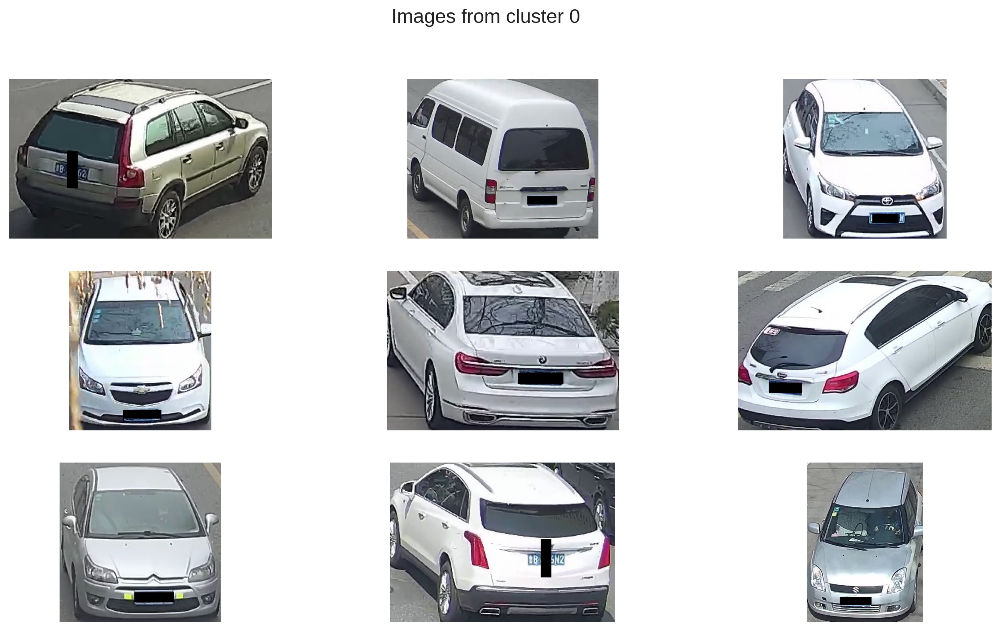

In [ ]:
plot_samples_images(
    data = descriptors,
    cluster_feature = 'cluster',
    cluster_label = 0,
    figsize = (15,8)
)

In [ ]:
plot_samples_images(
    data = descriptors,
    cluster_feature = 'cluster',
    cluster_label = 1,
    figsize = (15,8)
)

## 3.7. Визуализация выбросов

In [ ]:
plot_samples_images(
    data = descriptors,
    cluster_feature = 'dbscan',
    cluster_label = 2,
    figsize = (15,8)
)

## 3.8. Выводы по дескрипторам **vdc_color.pickle**

- Данные содержат 128 признаков, пропусков и дубликатов нет.
- Снижена размерность данных до 50, использован алгоритм KMeans для кластеризации.
- Получены 2 кластера.
- Основной принцип раделения данных на кластеры - это цвет и тип автомобиля:
  - 0 кластер: легковые автомобили светлых цветов (преимущественно белые и светло-серые)
  - 1 кластер: другие типы транспортных средств темных цветов.
- Использован алгоритм DBSCAN для поиска выбросов - получено 14 кластеров, выбросами посчитаем кластеры с количеством объектов менее 600 (11 кластеров).
- Изображения в выбросах: автомобили также группируются по цветам и типам, блики и засветы на изображениях, отражения деревьев, ветвей на стекле и корпусе авто, различные предметы за стеклами.
- Кластризация на основе данных дескрипторов лучше, чем на предыдущих двух.

In [ ]:
# сохраним данные
descriptors.to_csv(PATH_OUTPUT + 'vdc_color.csv', index=False)

***

# 4. Дескрипторы **vdc_type.pickle**

## 4.1. Загрузка, первичная обработка и знакомство с данными

In [ ]:
%%time
descriptors = load_descriptors('vdc_type.pickle')

vdc_type.pickle
Размерность: (416314, 512)
Размерность с путями к файлам: (416314, 513)
Количество строк, содержащих пропуски 0
Число найденных дубликатов: 0

CPU times: user 18.4 s, sys: 716 ms, total: 19.1 s
Wall time: 21.9 s


## 4.2. Проводим тестовую кластеризацию
- Алгоритмы: **KMeans** и **AgglomerativeClustering**
- Количество кластеров **2-10**
- Внутренние меры: **Calinski-Harabasz Index**, **Davies-Bouldin Index**

Разменость данных (стандартизация, PCA n_components=50): (416314, 50)

Внутренние меры алгоритмов KMeans и AgglomerativeClustering (стандартизация, PCA n_components=50)


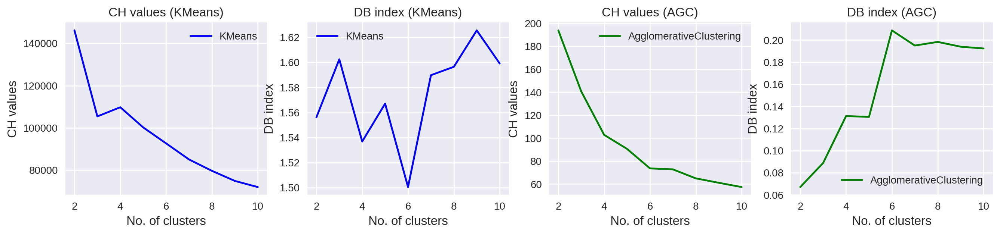

,clusters,KMeans_CH_value,AGC_CH_value,KMeans_DB_index,AGC_DB_index,KMeans_object_cluster_counts,AGC_object_cluster_counts
0,2,146146.159073,193.906079,1.556086,0.067066,"[223978, 192336]","[416313, 1]"
1,3,105432.071333,140.730740,1.602421,0.088912,"[196160, 184216, 35938]","[416312, 1, 1]"
2,4,109774.210962,102.886280,1.536818,0.131299,"[151391, 164357, 39602, 60964]","[416311, 1, 1, 1]"
3,5,100237.503455,90.633676,1.567055,0.130497,"[149585, 58414, 23402, 79083, 105830]","[416310, 1, 1, 1, 1]"
4,6,92671.995989,73.656828,1.500469,0.208780,"[103761, 73885, 3934, 37791, 139692, 57251]","[416309, 1, 1, 1, 1, 1]"
5,7,85069.132885,72.831040,1.589761,0.195056,"[89632, 81610, 2878, 110124, 25679, 54454, 51937]","[416308, 1, 1, 1, 1, 1, 1]"
6,8,79681.033428,64.972554,1.596469,0.198344,"[89772, 47906, 2884, 25609, 81547, 84408, 3224...","[416307, 1, 1, 1, 1, 1, 1, 1]"
7,9,74908.863250,61.138060,1.625520,0.194035,"[47310, 89058, 2316, 10825, 64604, 73787, 2247...","[416306, 1, 1, 1, 1, 1, 1, 1, 1]"
8,10,72003.949695,57.413741,1.599083,0.192414,"[21143, 59318, 2310, 29878, 67165, 10838, 4600...","[416305, 1, 1, 1, 1, 1, 1, 1, 1, 1]"


------------------------------------------------------------------------------------------------------------------------------------------------------
Разменость данных (нормализация, SVD n_components=50): (416314, 50)

Внутренние меры алгоритмов KMeans и AgglomerativeClustering (нормализация, SVD n_components=50)


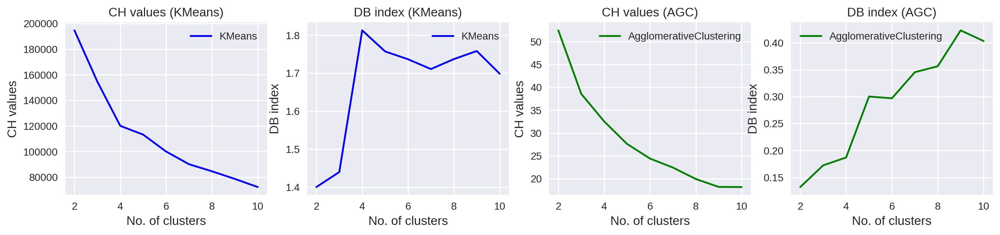

,clusters,KMeans_CH_value,AGC_CH_value,KMeans_DB_index,AGC_DB_index,KMeans_object_cluster_counts,AGC_object_cluster_counts
0,2,194640.715711,52.491873,1.400095,0.132027,"[223065, 193249]","[416313, 1]"
1,3,154635.352426,38.586653,1.439663,0.172379,"[157818, 61555, 196941]","[416312, 1, 1]"
2,4,120103.839495,32.543895,1.812746,0.186898,"[62076, 169248, 107200, 77790]","[416311, 1, 1, 1]"
3,5,113240.276985,27.602372,1.757280,0.300145,"[82259, 76471, 61788, 91669, 104127]","[416309, 2, 1, 1, 1]"
4,6,100059.880959,24.403754,1.736689,0.296917,"[85622, 82331, 88521, 34774, 48887, 76179]","[416308, 2, 1, 1, 1, 1]"
5,7,90140.087402,22.430171,1.710859,0.345363,"[24051, 76951, 46803, 73066, 86079, 77425, 31939]","[416306, 2, 2, 1, 1, 1, 1]"
6,8,84628.649819,19.921074,1.737057,0.356402,"[23659, 30529, 45159, 79537, 66715, 27583, 652...","[416305, 2, 2, 1, 1, 1, 1, 1]"
7,9,78686.709200,18.180823,1.758376,0.423050,"[21236, 61397, 77148, 63297, 54816, 30316, 369...","[416303, 2, 2, 2, 1, 1, 1, 1, 1]"
8,10,72323.592949,18.156753,1.698579,0.403315,"[21554, 77546, 65928, 30198, 44890, 42489, 613...","[2, 416302, 2, 2, 1, 1, 1, 1, 1, 1]"


------------------------------------------------------------------------------------------------------------------------------------------------------
Разменость данных (стандартизация, SVD n_components=50): (416314, 50)

Внутренние меры алгоритмов KMeans и AgglomerativeClustering (стандартизация, SVD n_components=50)


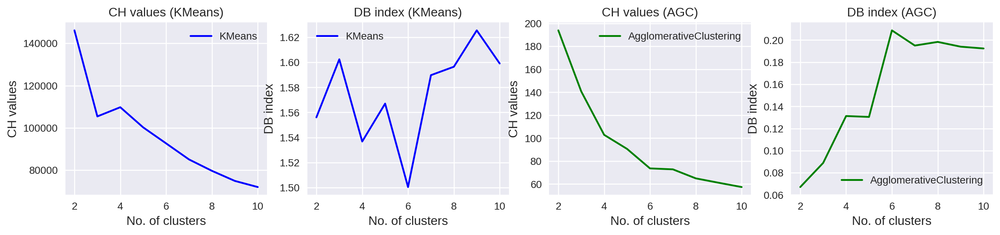

,clusters,KMeans_CH_value,AGC_CH_value,KMeans_DB_index,AGC_DB_index,KMeans_object_cluster_counts,AGC_object_cluster_counts
0,2,146146.172620,193.905980,1.556086,0.067066,"[223978, 192336]","[416313, 1]"
1,3,105432.066307,140.730664,1.602421,0.088912,"[196160, 184216, 35938]","[416312, 1, 1]"
2,4,109774.195517,102.886248,1.536818,0.131300,"[151391, 164357, 39602, 60964]","[416311, 1, 1, 1]"
3,5,100237.483508,90.633627,1.567056,0.130497,"[149585, 58414, 23402, 79083, 105830]","[416310, 1, 1, 1, 1]"
4,6,92671.973377,73.656784,1.500469,0.208780,"[103759, 73885, 3934, 37791, 139694, 57251]","[416309, 1, 1, 1, 1, 1]"
5,7,85069.115807,72.831020,1.589762,0.195056,"[89632, 81610, 2878, 110124, 25679, 54454, 51937]","[416308, 1, 1, 1, 1, 1, 1]"
6,8,79680.999703,64.972531,1.596482,0.198344,"[89772, 47906, 2884, 25609, 81547, 84408, 3224...","[416307, 1, 1, 1, 1, 1, 1, 1]"
7,9,74908.844937,61.138037,1.625506,0.194035,"[47310, 89059, 2316, 10825, 64596, 73790, 2247...","[416306, 1, 1, 1, 1, 1, 1, 1, 1]"
8,10,72003.930338,57.413720,1.599083,0.192414,"[21143, 59318, 2310, 29878, 67165, 10838, 4600...","[416305, 1, 1, 1, 1, 1, 1, 1, 1, 1]"


CPU times: user 4min 31s, sys: 2min 11s, total: 6min 43s
Wall time: 4min 7s


In [ ]:
%%time
clusterisation_test(
    descriptors, # датафрейм с дескрипторами
    50 # количество компонент для методов PCA, SVD
)

**Выводы:**
- Алгоритм AgglomerativeClustering снова хуже справляется с кластеризацией данных:
  - хуже внутренние меры
  - плохое разделение на кластеры: по сути создается один кластер и оставшиеся заполняются единичными объектами
- Алгоритм KMeans справляется с кластеризацией лучше
- Внутренние меры указывают, что более эффективен вариант: нормализация, SVD n_components=50
- Calinski-Harabasz Index и Davies-Bouldin Index указыввют нам, что лучше создать 2 кластера
- При этом внутренние меры демонстрируют лучшие метрики (!) по сравнению с предыдущими дескрипторами.

## 4.3. Проводим окончательную кластеризацию
- метод уменьшения размерности: **SVD** (*нормализация*, *n_components=50*)
- алгоритм кластеризации: **KMeans**
- количество кластеров: **2**

In [ ]:
%%time
# нормализация данных
scaler = MinMaxScaler()
descriptors_norm = scaler.fit_transform(descriptors.drop('paths', axis=1))

# используем алгоритм SVD для уменьшения размерности данных
desсriptors_svd = TruncatedSVD(n_components=50, random_state=random_state).\
    fit_transform(descriptors_norm)

# алгоритм кластеризации KMeans
km = KMeans(n_clusters=2, random_state=random_state)
# обучаем его на наших данных с уменьшенной размерностью
km.fit_predict(desсriptors_svd)

# получаем метки кластеров
predict_km = km.labels_

# снизим размерность данных для 2D и 3D визуализации
descriptors_visual_2D = TSNE(n_components=2, random_state=random_state).fit_transform(descriptors_norm)
descriptors_visual_3D = PCA(n_components=3, random_state=random_state).fit_transform(descriptors_norm)

# добавим метки кластеров в данные
descriptors_visual_2D = np.append(descriptors_visual_2D, predict_km.values.reshape(-1,1), axis=1)
descriptors_visual_3D = np.append(descriptors_visual_3D, predict_km.values.reshape(-1,1), axis=1)
descriptors['cluster'] = predict_km

# выведем в виде таблицы кластеры и количество объектов в них
display(descriptors.groupby('cluster').agg({0:'count'}).reset_index().rename(columns={0:'count'}))

/usr/local/lib/python3.10/dist-packages/cuml/internals/api_decorators.py:344: UserWarning: Starting from version 22.04, the default method of TSNE is 'fft'.
  return func(**kwargs)


[W] [17:29:04.455058] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


,cluster,count
0,0,223065
1,1,193249


CPU times: user 30.3 s, sys: 640 ms, total: 31 s
Wall time: 30.6 s


**Вывод:** получено 2 кластера 0 и 1 с количеством объектов 223065 и 193249 соответственно.

## 4.4. Визуализация кластеров

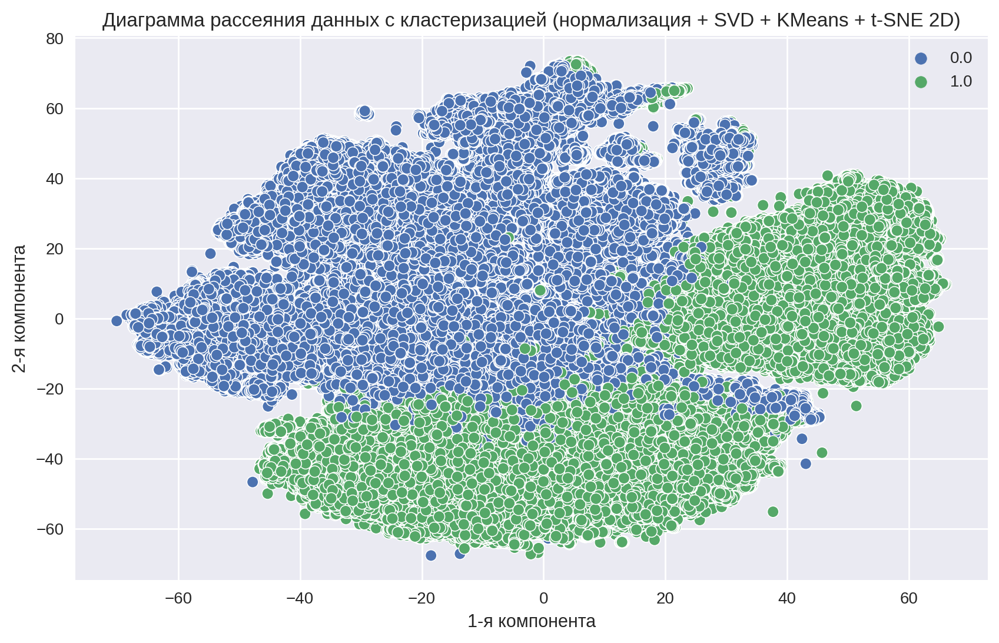

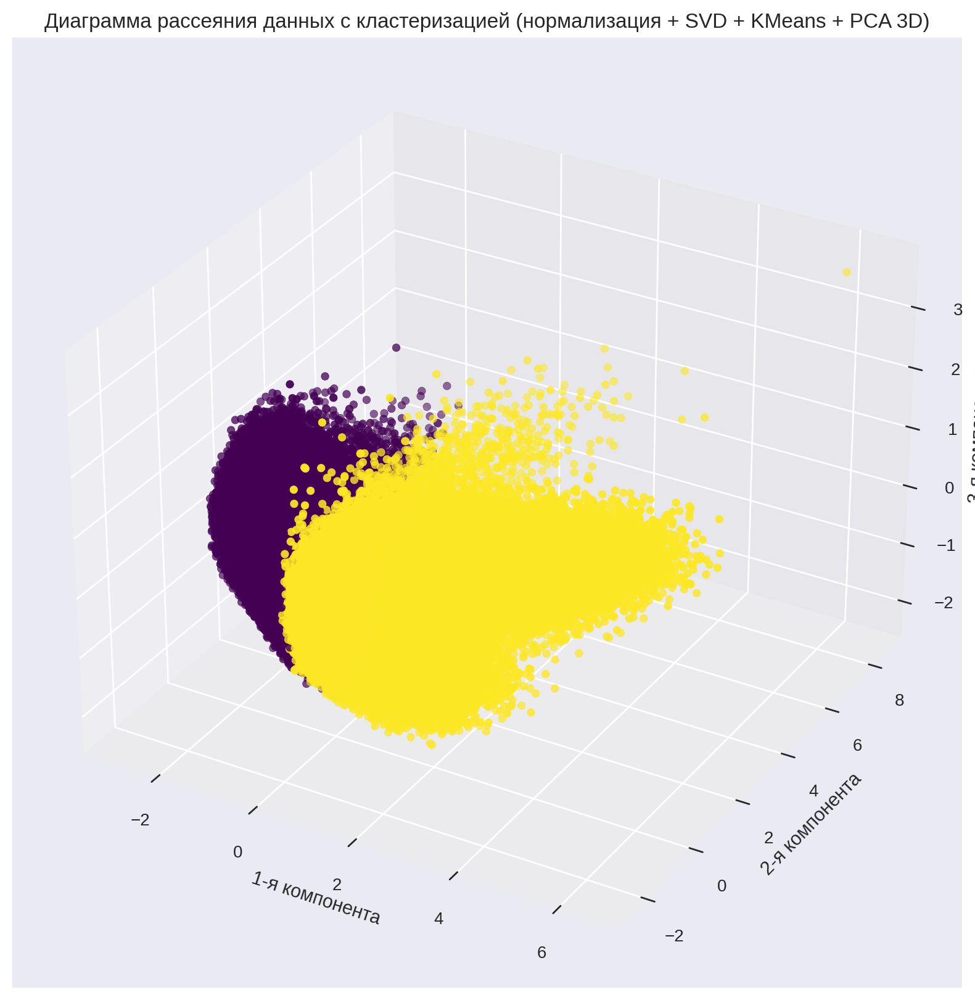

CPU times: user 26.4 s, sys: 5.48 s, total: 31.9 s
Wall time: 27.2 s


In [ ]:
%%time
clusters_visualisation(
    data_2D = descriptors_visual_2D, # массив с 2 компонентами
    data_3D = descriptors_visual_3D, # массив с 3 компонентами
    title_2D = 'нормализация + SVD + KMeans + t-SNE 2D', # данные для заголовка 2D визуализации
    title_3D = 'нормализация + SVD + KMeans + PCA 3D' # данные для заголовка 3D визуализации
)

**Выводы:**
- главный вывод, по сравнению с предыдущими дескрипторами - более хорошее разделение на кластеры на 2D визуализации.

## 4.5. Поиск выбросов

Используем алгоритм DBSCAN для поиска выбросов (вручную переберем разные параметры алгоритма).

In [ ]:
%%time
# алгоритм кластеризации DBSCAN
dbs = DBSCAN(eps=0.01, min_samples=5)
# обучаем его на наших данных с уменьшенной размерностью для 2D визуализации (за вычетом меток кластеров KMeans)
dbs.fit_predict(descriptors_visual_2D[:,:2])

# получаем метки кластеров
predict_dbs = dbs.labels_

# добавим метки кластеров в данные
descriptors_visual_2D = np.append(descriptors_visual_2D[:,:2], predict_dbs.reshape(-1,1), axis=1)
descriptors_visual_3D = np.append(descriptors_visual_3D, predict_dbs.reshape(-1,1), axis=1)
descriptors['dbscan'] = predict_dbs

# выведем в виде таблицы кластеры и количество объектов в них
display(descriptors.groupby('dbscan').agg({0:'count'}).reset_index().rename(columns={0:'count'}))

[W] [17:37:47.914899] Batch size limited by the chosen integer type (4 bytes). 16322 -> 5158. Using the larger integer type might result in better performance


,dbscan,count
0,-1,416115
1,0,15
2,1,6
3,2,8
4,3,5
5,4,7
6,5,13
7,6,21
8,7,6
9,8,5


CPU times: user 3.05 s, sys: 24.9 ms, total: 3.07 s
Wall time: 3.03 s


Мы получили 27 кластеров. Выбросами будем считать 26 кластеров с количеством объектов менее 22.

## 4.6. Визуализация изображений в кластерах KMeans

In [ ]:
plot_samples_images(
    data = descriptors,
    cluster_feature = 'cluster',
    cluster_label = 0,
    figsize = (15,8)
)

In [ ]:
plot_samples_images(
    data = descriptors,
    cluster_feature = 'cluster',
    cluster_label = 1,
    figsize = (15,8)
)

## 4.7. Визуализация выбросов

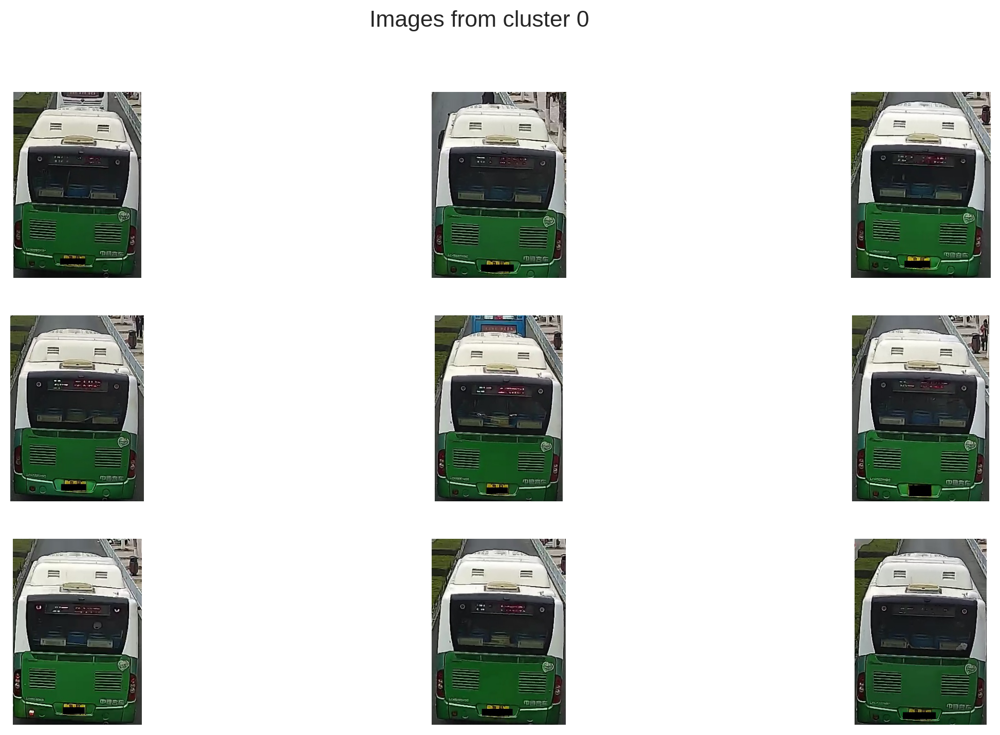

In [ ]:
plot_samples_images(
    data = descriptors,
    cluster_feature = 'dbscan',
    cluster_label = 0,
    figsize = (15,8)
)

In [ ]:
plot_samples_images(
    data = descriptors,
    cluster_feature = 'dbscan',
    cluster_label = 2,
    figsize = (15,8)
)

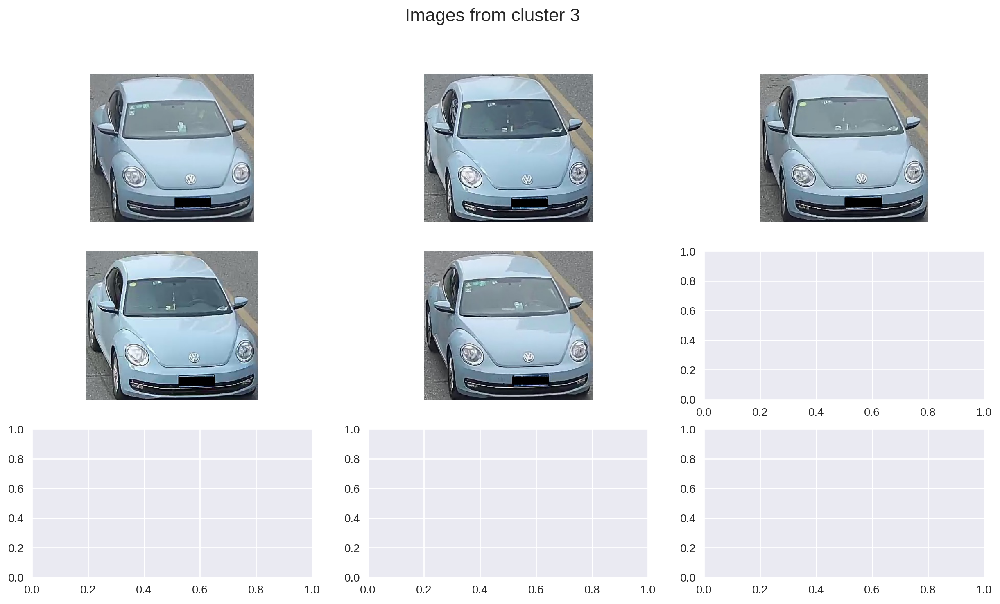

In [ ]:
plot_samples_images(
    data = descriptors,
    cluster_feature = 'dbscan',
    cluster_label = 3,
    figsize = (15,8)
)

## 4.8. Выводы по дескрипторам **vdc_type.pickle**

- Данные содержат 128 признаков, пропусков и дубликатов нет.
- Снижена размерность данных до 50, использован алгоритм KMeans для кластеризации.
- Получены 2 кластера.
- Основной принцип раделения данных на кластеры - это тип автомобиля:
  - 0 кластер: крупные транспортные средства (универсалы, минивены, паркетники и внедорожники, микроавтобусы и т.д.)
  - 1 кластер: обычные легковые автомобили.
- Использован алгоритм DBSCAN для поиска выбросов - получено 27 кластеров, однако складывается ощущение, что алгоритм нашел не выбросы, а сгруппировал транспортные средства одного цвета и марки.
- Кластризация на основе данных дескрипторов лучше, чем на первых двух, метрика внутренних мер наилучшая.

In [ ]:
# сохраним данные
descriptors.to_csv(PATH_OUTPUT + 'vdc_type.csv', index=False)

# 5. Выводы по проекту

Ключевой проблемой проекта для меня явился большой объем данных в виде изображений, для обработки которого необходимы мощные вычислительные ресурсы. Это привело к тому, что не все гипотезы я смог проверить за ограниченный промежуток времени и мое решение, к сожалению, не идеально.

На мой взгляд, дескрипторы **efficientnet-b7** содержат слишком много признаков, что затрудняет процесс кластеризации и приводит к плохим результатам даже при уменьшении размерности. Кластеризация на основе данных дескрипторов неудовлетворительна, как впрочем, и поиск выбросов в изображениях.

Дескрипторы **osnet** показывают себя уже лучше, кластеры разделяют объекты по цветовой гамме и выделение выбросов мне понравилось больше, они группируются по цветам.

Дескрипторы **vdc_color** показывают еще более хороший результат, разделяя транспортные средства по цветам на светлые и темные, а также неплохо выделяя выбросы, группируя их по цвету.

Дескрипторы **vdc_type** очень эффективны в плане кластеризации транспортных средств по их размеру, наилучшая метрика внутренних мер. Но что касается попыток поиска выбросов - DBSCAN группирует данные по цвету и марке автомобиля.

На мой взгляд, использование комбинации дескрипторов **vdc_color** и **vdc_type** и поиск оптимальных параметров DBSCAN будет полезно для улучшения результатов кластеризации и поиска выбросов.

